In [44]:
import optuna
import os

import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

from torch.utils.data import Dataset,DataLoader,random_split
from torch.utils.tensorboard import SummaryWriter
from torchvision import models, transforms
from torch_lr_finder import LRFinder

import h5py
from datetime import datetime
import matplotlib.pyplot as plt
import copy
from Library.datasets import DatasetH5TwoRandom, DatasetH5ForTest, compute_std_mean
from Library.transforms import RandomFlip,RandomOffset,RandomRotateGrayscale
from Library.scheduler import OneCycleLR,LogLR
from Library.cresnet import initialize_cresnet
from Library.dml import RefBasedDeepMetric
from Library.models.FeatureExtractor import FeatureExtractor, Block, CustomNet
from Library.trainers import RefBasedDeepMetricTrainer
from tqdm.notebook import tqdm

In [2]:
from Library.util import (
    jupyter_wide_screen,
    strings_contain_words, 
    strings_contain_patterns, 
    add_unique_entry
)

jupyter_wide_screen()

In [3]:
def init_dataset(path,seq_idx_list,mean_val,std_val):

    ds_h5 = []
    refs_list = []

    img_transforms = [RandomRotateGrayscale(rot_range=[-0.1, 0.1], fill=150),
                      RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    # to obtain the Seq data
    for seq_idx in seq_idx_list:
        h5_fpath = path.format(seq_idx)
        h5_f = DatasetH5TwoRandom(h5_fpath,transform = composed_img_transforms)
        
        # obtain the references, the first 10 images in every Seq.
        refs = h5_f.getRef()
        refs_list.append(refs)
        
        ds_h5.append(h5_f)

    return refs_list, ds_h5

def init_dataloaders(datasets,ds_ratio):
    dataloaders = []
    
    for ds in datasets:
        splitted_ds_num_data = [round(len(ds) * ds_ratio[i]) for i in range(len(ds_ratio))]
        splitted_ds_num_data[0] += len(ds) - int(np.sum(splitted_ds_num_data))

        splitted_ds = []

        for tmp_ds, batch_size, shuffle in zip(random_split(ds, splitted_ds_num_data), batch_sizes, shuffle_flags):

            splitted_ds.append(
                DataLoader(
                    tmp_ds,
                    batch_size=batch_size,
                    shuffle=shuffle,
                    drop_last=True,
                )
            )

        dataloaders.append(splitted_ds)
    return dataloaders


In [ ]:
########## Config ##########
## Load Data
# type 2 Data New regenerated data
data_path_type2 = "../MA/NewData/21503_1000200411_653340003"
fnames_type2 = "regenerated_roi_ms1_seq{}_720x30.h5" # 2,3,4
combined_path = os.path.join(data_path_type2, fnames_type2)
seq_idx_list = [2,3,4]
'''
#Type 1 Data
data_path = "../MA/NewData/22008_1000202026_652510007"
fnames = "regenerated_roi_ms1_seq{}_720x30.h5" # 0-8
refs_list, ds_h5 = init_dataset(data_path,fnames)
'''
# Dataloader for training set ,validation set, test set (60%,20%,20%)
inputs_shape = [1,720,24]
batch_sizes = [32, 32]
shuffle_flags = [True, False]
ds_ratio = [0.8, 0.2]

# Initialize datasets 
#mean_val, std_val = compute_std_mean(seq_idx_list, combined_path)
mean_val = 0
std_val = 255
refs_list, ds_h5 = init_dataset(combined_path, seq_idx_list, mean_val, std_val)

# Initialize dataloaders
dataloaders = init_dataloaders(ds_h5, ds_ratio)
train_dls = [dls[0] for dls in dataloaders]
valid_dls = [dls[1] for dls in dataloaders]

# Training config
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
num_epochs = 50
phases_ratio = [0.2, 0.2, 0.4, 0.2]

## Load Model

In [8]:
model_path = 'optuna_models/RefFreeDeepMetric_Model_v6_old_3stride_t2'

In [9]:
with open(os.path.join(model_path, 'config.json')) as f:
    cresnet_config = json.load(f)
    
weight_fpath = os.path.join(model_path, 'model.weight')

device = torch.device("cuda:0")

In [10]:
cresnet_config

{'loss_non_linearity_name': 'sigmoid',
 'criterion_name': 'bce',
 'cresnet_config': {'InputShape': [1, 720, 24],
  'BlockName': 'LeakyBasicBlock',
  'NumBlocks': [3, 3, 3, 3, 3, 3, 3],
  'NumChannels': [24, 24, 48, 48, 96, 96, 192],
  'Strides': [[2, 2], [2, 2], [2, 1], [2, 2], [2, 2], [2, 1], [2, 1]],
  'NumNeurons': [32],
  'EnableGlobalAveragePooling': True,
  'PrintIntermediateShape': False,
  'InitializeResidual': True}}

In [11]:
model = RefBasedDeepMetric.load_pretrained_cresnet(model_path, device, show_config=True)

{'loss_non_linearity_name': 'sigmoid', 'criterion_name': 'bce', 'cresnet_config': {'InputShape': [1, 720, 24], 'BlockName': 'LeakyBasicBlock', 'NumBlocks': [3, 3, 3, 3, 3, 3, 3], 'NumChannels': [24, 24, 48, 48, 96, 96, 192], 'Strides': [[2, 2], [2, 2], [2, 1], [2, 2], [2, 2], [2, 1], [2, 1]], 'NumNeurons': [32], 'EnableGlobalAveragePooling': True, 'PrintIntermediateShape': False, 'InitializeResidual': True}}


In [12]:
model.to(device)

RefBasedDeepMetric(
  (feature_extractor): CResNet(
    (Block0): Sequential(
      (0): LeakyBasicBlock(
        (conv1): Conv2d(1, 24, kernel_size=(3, 3), stride=[2, 2], padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): LeakyReLU(negative_slope=0.01, inplace=True)
        (conv2): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (downsample): Sequential(
          (0): Conv2d(1, 24, kernel_size=(1, 1), stride=[2, 2], bias=False)
          (1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        )
      )
      (1): LeakyBasicBlock(
        (conv1): Conv2d(24, 24, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn1): BatchNorm2d(24, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu

## Test Model

In [13]:
def init_test_dataset(path,seq_idx_list,mean_val,std_val):

    ds_h5_test = []
    refs_list = []
    
    ### 可能还需要用 transforms.RandomHorizontalFlip()
    #img_transforms = [transforms.ToTensor(),transforms.Normalize((mean_val,),(std_val,))] # 先标准化处理
    img_transforms = [RandomRotateGrayscale(rot_range=[-0.1, 0.1], fill=150),
                      RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    # to obtain the Seq data
    for seq_idx in seq_idx_list:
        h5_fpath = path.format(seq_idx)
        h5_f_test =  DatasetH5ForTest(h5_fpath,normalize_im=False, transform = composed_img_transforms)
        
        # obtain the references, the first 10 images in every Seq.
        refs = h5_f_test.getRef()
        refs_list.append(refs)

        ds_h5_test.append(h5_f_test)
    
    return refs_list, ds_h5_test

In [14]:
#data_path_type1 = "../MA/NewData/22008_1000202026_652510007"
#fnames_type1 = "CleanOutliers_Padding_roi_seq{}_720x24.h5"
data_path_type1 = "../MA/NewData/22008_1000202026_652510007"
fnames_type1 = "roi_versuch2_1_{}_720x20.h5"
combined_path = os.path.join(data_path_type1, fnames_type1)
seq_idx_list = [0,1,2,3,4,5,6]

In [15]:
#mean_val, std_val = compute_std_mean(seq_idx_list, combined_path)
mean_val = 0
std_val = 255
refs_list, ds_h5_test = init_test_dataset(combined_path, seq_idx_list, mean_val, std_val)

In [16]:
ds_h5_test

In [17]:
batch_size = 1
test_dataloaders = []
for ds in ds_h5_test: 
    test_dataloader = DataLoader(dataset = ds, batch_size=batch_size, shuffle = False)
    test_dataloaders.append(test_dataloader)

In [18]:
all_seq_y_tilde_vect = np.zeros(0)
time_ids = []

for refs,dl in zip(refs_list, test_dataloaders):

    curr_refs = refs.float().to(device)
    num_data = len(dl)
    print(num_data)
    
    loss_vect = np.zeros(num_data)
    var_res_vect= np.zeros(num_data)

    y_vect = np.zeros(num_data)
    y_tilde_vect = np.zeros(num_data)
    
    dl_iter = iter(dl)

    for i in tqdm(range(num_data)):
        try:
            img,label = next(dl_iter)

        except (StopIteration, TypeError):
            dl_iter = iter(curr_train_dl)
            img,label = next(dl_iter)
            
        y_vect[i] = label
        
        img = img.float().to(device)
                
        #targets = targets.float().to(device)
        
        #v1, refs_v = model.forward_test(img, curr_refs)
        #metric = degradation_metrics(v1,refs_v)
        
        metric = model.forward(img, curr_refs)
        
        y_tilde = metric.detach().cpu().numpy()

        var_res_vect[i] = np.var(y_tilde)

        y_tilde_vect[i] = y_tilde.mean()

        loss_vect[i] = np.abs(label - y_tilde_vect[i])
        
    time_ids.append(y_tilde_vect.size)
        
    all_seq_y_tilde_vect = np.concatenate((all_seq_y_tilde_vect, y_tilde_vect))

1991



2449



6819



4424



5221



4680



5576


In [20]:
import pandas as pd

<IPython.core.display.Javascript object>


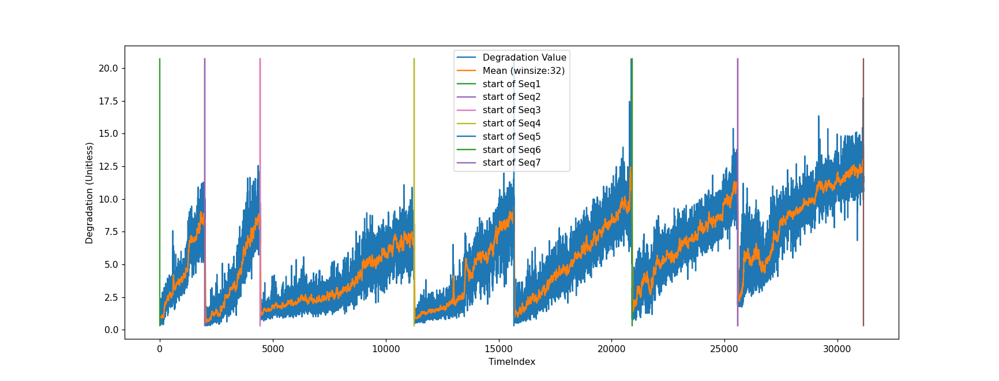

In [21]:
%matplotlib notebook
plt.plot(all_seq_y_tilde_vect, label='Degradation Value')
plt.plot(pd.Series(all_seq_y_tilde_vect).rolling(32).mean(), label='Mean (winsize:32)')

min_y = all_seq_y_tilde_vect.min()
max_y = all_seq_y_tilde_vect.max()

'''
# Type 1 Data with 10 refs clean outliers
seq_period_iloc = [
    [    0,  1988],
    [ 1988, 4432],
    [ 4432, 11242],
    [ 11242, 15654],
    [ 15654, 20662],
    [ 20662, 25335],
    [ 25335, 30888],
]
'''
# Type 1 Data with 10 refs
seq_period_iloc = [
    [    0,  1991],
    [ 1991, 4440],
    [ 4440, 11259],
    [ 11259, 15683],
    [ 15683, 20904],
    [ 20904, 25584],
    [ 25584, 31160],
]



'''
# Type 1 Data with 32 refs
seq_period_iloc = [
    [    0,  1969],
    [ 1969,  4396],
    [ 4396, 11193],
    [ 11193, 15595],
    [ 15595, 20794],
    [ 20794, 25452],
    [ 25452, 31006],
]
'''
seq_index = 1
for stime_iloc, etime_iloc in seq_period_iloc:
    plt.plot([stime_iloc, stime_iloc], [min_y, max_y], label = "start of Seq{}".format(seq_index))
    plt.plot([etime_iloc, etime_iloc], [min_y, max_y])
    seq_index += 1


plt.ylabel("Degradation (Unitless)")
plt.xlabel("TimeIndex")

plt.legend()
plt.show()

In [22]:
import plotly.graph_objects as go
import pandas as pd
fig = go.Figure()

fig = go.Figure()

plot_raw_pts = True
    
fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=all_seq_y_tilde_vect,
        mode='lines',
        name = 'Degradation (Unitless)',
        #mode='lines+markers',
    )
)

fig.add_trace(
    go.Scatter(
        x=np.arange(all_seq_y_tilde_vect.size),
        y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean(),
        mode='lines',
        name = 'Mean (winsize:32)'
        #mode='lines+markers',
    )
)

## Find outliers

In [23]:
all_seq_y_tilde_vect.size

31160

In [24]:
mov_aver = pd.Series(all_seq_y_tilde_vect).rolling(32, min_periods=1).mean()
rel_outlier_idx = np.abs(all_seq_y_tilde_vect - mov_aver) > 3

In [27]:
res = all_seq_y_tilde_vect - mov_aver

In [28]:
y=pd.Series(all_seq_y_tilde_vect).rolling(32).mean()
y_firstpart = pd.Series(all_seq_y_tilde_vect[:32]).rolling(32).mean()

In [29]:
import plotly.offline as pyo
trace0 = go.Scatter(
            x=np.arange(all_seq_y_tilde_vect.size),
            y=res,
            mode='lines',
            name='Subtract the mean',
            #mode='lines+markers',
    )



trace1 = go.Scatter(
            x= np.arange(all_seq_y_tilde_vect.size),
            y= np.linspace(3, 3,all_seq_y_tilde_vect.size),
            mode='lines',
            name = 'Threshold',
            #mode='lines+markers',
            )

trace2 = go.Scatter(
            x= np.arange(all_seq_y_tilde_vect.size),
            y= np.linspace(-3,-3,all_seq_y_tilde_vect.size),
            mode='lines',
            name = 'Threshold',
            #mode='lines+markers',
            )

# Fill out data with our traces
data = [trace0, trace1,trace2]
# Plot it and save as basic-line.html
pyo.iplot(data, filename = 'basic-line')

In [30]:
outliers = np.where(abs(res) > 3, True, res)

In [31]:
outliers[2088]

-0.2949495855718851

In [32]:
index = np.argwhere(outliers == True)

In [33]:
index

array([[  571],
       [  576],
       [ 1239],
       [ 1692],
       [ 1833],
       [ 1859],
       [ 1887],
       [ 1911],
       [ 1928],
       [ 1991],
       [ 1992],
       [ 1993],
       [ 1994],
       [ 1995],
       [ 1996],
       [ 1997],
       [ 1998],
       [ 1999],
       [ 2000],
       [ 2001],
       [ 2002],
       [ 2003],
       [ 2004],
       [ 2006],
       [ 2007],
       [ 2008],
       [ 2009],
       [ 2010],
       [ 2011],
       [ 2765],
       [ 3534],
       [ 3667],
       [ 3736],
       [ 3768],
       [ 3810],
       [ 3869],
       [ 3873],
       [ 3882],
       [ 3883],
       [ 3973],
       [ 3985],
       [ 4054],
       [ 4079],
       [ 4140],
       [ 4141],
       [ 4223],
       [ 4317],
       [ 4336],
       [ 4345],
       [ 4365],
       [ 4374],
       [ 4408],
       [ 4440],
       [ 4441],
       [ 4442],
       [ 4443],
       [ 4444],
       [ 4445],
       [ 4446],
       [ 4447],
       [ 4448],
       [ 4449],
       [

# 打印loss值

In [45]:
## Load Data
# 3 Stripes data -- Type 1
data_path_type1 = "../MA/NewData/22008_1000202026_652510007"
fnames_type1 = "Padding_regenerated_roi_ms1_seq{}_720x24.h5" # 0,1,2,3,4,5,6
combined_path_type1 = os.path.join(data_path_type1, fnames_type1)
seq_idx_list_type1 = [0,1,2,3,4,5,6]

# Dataloader for training set, test set (80%,20%)
inputs_shape = [1,720,24]
batch_sizes = [32, 32,32]
shuffle_flags = [True, False, False]
ds_ratio = [0.6, 0.2, 0.2]

In [46]:
#### To initialize dataset: obtain References and Dataset object
def init_dataset(path,seq_idx_list,mean_val,std_val):

    ds_h5 = []
    refs_list = []
    
    ### 可能还需要用 transforms.RandomHorizontalFlip()  RandomRotate
    #img_transforms = [transforms.ToTensor(),transforms.Normalize((mean_val,),(std_val,))] # 先标准化处理
    img_transforms = [RandomRotateGrayscale(rot_range=[-0.1, 0.1], fill=150),
                      RandomFlip(lr_prob=0.5, ud_prob=0.5),
                      transforms.ToTensor(),
                      transforms.Normalize((mean_val,),(std_val,))]
    
    composed_img_transforms = transforms.Compose(img_transforms)
    
    # to obtain the Seq data
    for seq_idx in seq_idx_list:
        h5_fpath = path.format(seq_idx)
        h5_f = DatasetH5TwoRandom(h5_fpath,transform = composed_img_transforms)
        
        # obtain the references, the first 10 images in every Seq.
        refs = h5_f.getRef()
        refs_list.append(refs)
        
        ds_h5.append(h5_f)

    return refs_list, ds_h5

In [47]:
mean_val = 0
std_val = 255
refs_list, ds_h5 = init_dataset(combined_path_type1, seq_idx_list_type1, mean_val, std_val)

In [48]:
# Initialize dataloaders
dataloaders = init_dataloaders(ds_h5, ds_ratio)
train_dls = [dls[0] for dls in dataloaders]
valid_dls = [dls[1] for dls in dataloaders]
test_dls = [dls[2] for dls in dataloaders]

In [49]:
len(ds_h5)

7

In [50]:
num_epochs = 1

lr = 3.16e-4

min_lr_factor = 0.1
phases_ratio = [0.3, 0.2, 0.3, 0.2]

train_dl_idx = 0
valid_dl_idx = 1
test_dl_idx = 2

run_train = True

net_path = "../MA/save_net/"
criterion = nn.BCELoss()
def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']
    
dateTimeObj = datetime.now()
timestampStr = dateTimeObj.strftime("%d-%b-%Y (%H:%M:%S)")
print('Current Timestamp : ', timestampStr)

Current Timestamp :  28-May-2021 (14:27:19)


In [51]:
if run_train:
    writer = SummaryWriter('runs/test_01')
    max_iter_per_seq = 600
    # 训练迭代总步数
    num_train_iter_per_epoch = 0
    num_train_iterations = [] # For plot parting line
    num_train_iterations_per_dl = [max_iter_per_seq if len(dl)>= max_iter_per_seq else len(dl) for dl in train_dls]
    for seq_dataloaders in dataloaders:
        if len(seq_dataloaders[train_dl_idx]) <= max_iter_per_seq:
            num_train_iter_per_epoch += len(seq_dataloaders[train_dl_idx])
        else:
            num_train_iter_per_epoch += max_iter_per_seq
        num_train_iterations.append(num_train_iter_per_epoch)
    print("Total Train Iterations: ",num_train_iter_per_epoch)
    print("Total Train Iterations List: ",num_train_iterations)
        
    # 训练迭代总步数为验证迭代总步数的3倍
    num_val_iterations = [int(number / 3) for number in num_train_iterations]
    num_val_iter_per_epoch = num_val_iterations[-1]
    
    # iterations in every seq
    num_val_iter_per_seq = []
    num_val_iter_per_seq.append(num_val_iterations[0])
    for i in range(len(num_val_iterations)-1):
        diff = num_val_iterations[i+1] - num_val_iterations[i] # The latter minus the former
        num_val_iter_per_seq.append(diff)
        
    print("Valid iterations per seq: ",num_val_iter_per_seq)
        
    optimizer = torch.optim.Adam(model.parameters(),lr=lr,eps=1e-08)

    scheduler = OneCycleLR(optimizer, num_train_iter_per_epoch, num_epochs, min_lr_factor=min_lr_factor)
    scheduler.step(epoch=0)
    
    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.
    loss_min = 0.
    
    for epoch in tqdm(range(1,num_epochs+1)):

        print('Train')

        model.train()
        
        running_corrects = 0

        train_loss_array = np.zeros(num_train_iter_per_epoch, dtype=np.single)

        # mse_y = torch.zeros(batch_sizes[0]//2).to(device)
        
        i = 0
        seq_idx = 1
        for (refs, train_dl, max_num) in zip(refs_list, train_dls, num_train_iterations_per_dl):
            # obtain the refs in every seq
            
            curr_train_dl = train_dl

            curr_refs = refs.float().to(device)

            # Training
            dl_iter = iter(curr_train_dl)
            
            # This two only used to compute the loss and acc in every Sequence
            running_loss = 0
            corrects = 0
            for idx in tqdm(range(max_num)):
                if idx >= max_iter_per_seq:
                    break
                try:
                    img1, img2, targets = next(dl_iter)

                except (StopIteration, TypeError):
                    dl_iter = iter(curr_train_dl)
                    img1, img2, targets = next(dl_iter)
                
                scheduler.zero_grad()

                img1 = img1.float().to(device)
                img2 = img2.float().to(device)
                targets = targets.view(-1)
                targets = targets.float().to(device)

                # forward pass
                loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                
                loss.backward()
                
                running_loss += loss.item()
                corrects += torch.sum(preds == targets)
                running_corrects += torch.sum(preds == targets)

                train_loss_array[i] = loss.cpu().detach().numpy()
               
                
                # record loss and accuracy per iteration
                c = torch.sum(preds == targets)
                acc = int(c) / img1.size(0)
                writer.add_scalar('Train/Loss per Iteration',train_loss_array[i], ((epoch - 1) * num_train_iter_per_epoch)+ i)
                writer.add_scalar('Train/Acc per Iteration',acc, ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                # Record the lr
                curr_lr = get_lr(optimizer)
                writer.add_scalar('Train/Learning Rate',curr_lr , ((epoch - 1) * num_train_iter_per_epoch)+ i)
                
                i += 1
                scheduler.step()
            
            # record loss and accuracy in every train dataloader (namely every Sequence)
            #seq_train_mean_loss = running_loss / len(curr_train_dl)
            #seq_train_acc = int(corrects) / (len(curr_train_dl) * img1.size(0))
            seq_train_mean_loss = running_loss / max_num
            seq_train_acc = int(corrects) / (max_num * img1.size(0))
            
            print("Sequence:{}, Seq Training Mean Loss: {}, Seq Training Acc: {}".format(seq_idx, seq_train_mean_loss, seq_train_acc))
            print("******************************************************************")
            # Record the loss and acc in every Seq in Tensorboard
            writer.add_scalar('Train/Seq Training Mean Loss',seq_train_mean_loss, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Training Accuracy', seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            writer.add_scalar('Train/Seq Error Rate',1 - seq_train_acc, (epoch - 1) * len(train_dls) + seq_idx)
            
            seq_idx += 1
            
        # after one epoch update scheduler   
        # Plot lr policy
        curr_lr = get_lr(optimizer)
        writer.add_scalar('Train/Learning Rate Policy',curr_lr , epoch)
        writer.flush()
            
        # record loss and accuracy in every epoch (namely 6 Sequences)
        epoch_train_mean_loss = train_loss_array.mean()  # std
        epoch_train_acc = int(running_corrects) / (num_train_iter_per_epoch * img1.size(0))

        print("Epoch:{}, Epoch Training Loss Mean: {}, Epoch Training Acc: {}".format(epoch, epoch_train_mean_loss, epoch_train_acc))
        print("******************************************************************")
        
        ### Validation
        print('Validation')
        model.eval()
        val_loss_array = np.zeros(num_val_iter_per_epoch, dtype=np.single)
        
        running_corrects = 0

        i = 0
        with torch.no_grad():
            seq_idx = 1
            for (refs, valid_dl, max_num) in zip(refs_list,valid_dls, num_val_iter_per_seq):
                
                curr_valid_dl = valid_dl
                curr_refs = refs.float().to(device)
                iter_max_num = max_num
            
                dl_iter = iter(curr_valid_dl)
                # This two uesd to compute loss and accurary in every Seq
                running_loss = 0
                corrects = 0
                for dl_idx in tqdm(range(iter_max_num)):
                    try:
                        img1, img2, targets = next(dl_iter)
                    except (StopIteration, TypeError):
                        dl_iter = iter(curr_valid_dl)
                        img1, img2, targets = next(dl_iter)

                    img1 = img1.float().to(device)
                    img2 = img2.float().to(device)
                    targets = targets.view(-1)
                    targets = targets.float().to(device)
                
                    loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
                    running_loss += loss.item()
                    corrects += torch.sum(preds == targets)
                    running_corrects += torch.sum(preds == targets)
                    
                    # record loss and accuracy in every iteration
                    c = torch.sum(preds == targets)
                    acc = int(c) / img1.size(0)
                    writer.add_scalar('Validation/Loss per Iteration',loss.item(), ((epoch - 1) * num_val_iter_per_epoch)+ i)
                    writer.add_scalar('Validation/Acc per Iteration',acc, ((epoch - 1) * num_val_iter_per_epoch)+ i)

                    val_loss_array[i] = loss.cpu().detach().numpy()
                    i += 1
            
                #seq_val_mean_loss = running_loss / len(curr_valid_dl)
                #seq_val_acc = int(corrects) / (len(curr_valid_dl) * img1.size(0))
                seq_val_mean_loss = running_loss / iter_max_num
                seq_val_acc = int(corrects) / (iter_max_num * img1.size(0))
                print("******************************************************************")
                print("Sequence:{}, Seq Valid Mean Loss: {}, Seq Valid Acc: {}".format(seq_idx,seq_val_mean_loss, seq_val_acc))
                
                writer.add_scalar('Validation/Seq Mean Loss',seq_val_mean_loss, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Accuracy', seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                writer.add_scalar('Validation/Seq Error Rate',1 - seq_val_acc, (epoch - 1) * len(valid_dls) + seq_idx)
                
                seq_idx += 1
                
            epoch_val_mean_loss = val_loss_array.mean()  # std
            epoch_val_acc = int(running_corrects) / (num_val_iter_per_epoch * img1.size(0))

            print("Epoch:{}, Epoch Valid Mean Loss: {}, Epoch Valid Acc: {}".format(epoch, epoch_val_mean_loss, epoch_val_acc))
            print("******************************************************************")
            
        # save best model weights
        if epoch_val_acc > best_acc:
            best_model_wts = copy.deepcopy(model.state_dict())
            loss_min = epoch_val_mean_loss
            
        # Tensorboard
        writer.add_scalars('Epoch/Loss', {"Training Loss": epoch_train_mean_loss,
                                          "Validation Loss": epoch_val_mean_loss}, epoch)
        writer.add_scalars('Epoch/Accuracy', {"Training Accuracy":epoch_train_acc,
                                              "Validation Accuracy": epoch_val_acc}, epoch)
        writer.add_scalars('Epoch/Error Rate', {"Training": 1 - epoch_train_acc,
                                                "Validation": 1 - epoch_val_acc}, epoch)
        writer.flush()
        
        plt.plot(np.linspace(1, train_loss_array.size+1, train_loss_array.size), train_loss_array,label='Training Loss')
        plt.plot(np.linspace(1, train_loss_array.size+1, val_loss_array.size), val_loss_array, label='Validation Loss')
        
        train_parting_line = num_train_iterations  # 1128 iterations in total in training
        val_parting_line = num_val_iterations  # 373 iterations in total in validation
        plt.vlines(train_parting_line, 0, 2, colors = "tab:red", linestyles = "dashed")
        
        plt.title('Epoch {}'.format(epoch))
        plt.xlabel('Iterations')
        plt.ylabel('Loss')
        plt.legend(loc='upper right')
        plt.show()
        
    print("Save Model")
    torch.save(model, net_path + '/m-' + timestampStr)
    torch.save({'epoch': epoch, 
                'state_dict': best_model_wts, 
                'best_loss': loss_min,
                'optimizer': optimizer.state_dict()},
                net_path + '/m-' + timestampStr + '-' + str("%.4f" % loss_min) + '.pth.tar')
    # add model to tensorboard
    #writer.add_graph(model,(img1, curr_refs, targets))
    writer.flush()

    print('Finished Training')
        
        

Total Train Iterations:  579
Total Train Iterations List:  [37, 82, 209, 291, 388, 475, 579]
Valid iterations per seq:  [12, 15, 42, 28, 32, 29, 35]


Train



Sequence:1, Seq Training Mean Loss: 0.24714629271545926, Seq Training Acc: 0.8885135135135135
******************************************************************



Sequence:2, Seq Training Mean Loss: 0.2480065448416604, Seq Training Acc: 0.8840277777777777
******************************************************************



Sequence:3, Seq Training Mean Loss: 0.2951051064246283, Seq Training Acc: 0.8636811023622047
******************************************************************



Sequence:4, Seq Training Mean Loss: 0.2481594905257225, Seq Training Acc: 0.8833841463414634
******************************************************************



Sequence:5, Seq Training Mean Loss: 0.28286840313488676, Seq Training Acc: 0.8756443298969072
******************************************************************



Sequence:6, Seq Training Mean Loss: 0.27674735602976264, Seq Training Acc: 0.8688936781609196
******************************************************************



Sequence:7, Seq Training Mean Loss: 0.18685507960617542, Seq Training Acc: 0.9182692307692307
******************************************************************
Epoch:1, Epoch Training Loss Mean: 0.2574789822101593, Epoch Training Acc: 0.8822322970639033
******************************************************************
Validation



******************************************************************
Sequence:1, Seq Valid Mean Loss: 0.48959795385599136, Seq Valid Acc: 0.78125



******************************************************************
Sequence:2, Seq Valid Mean Loss: 0.332757431268692, Seq Valid Acc: 0.8479166666666667



******************************************************************
Sequence:3, Seq Valid Mean Loss: 0.4071490345966248, Seq Valid Acc: 0.796875



******************************************************************
Sequence:4, Seq Valid Mean Loss: 0.35190332361630033, Seq Valid Acc: 0.8448660714285714



******************************************************************
Sequence:5, Seq Valid Mean Loss: 0.3162145293317735, Seq Valid Acc: 0.8681640625



******************************************************************
Sequence:6, Seq Valid Mean Loss: 0.45203222796834747, Seq Valid Acc: 0.7931034482758621



******************************************************************
Sequence:7, Seq Valid Mean Loss: 0.281705476130758, Seq Valid Acc: 0.8803571428571428
Epoch:1, Epoch Valid Mean Loss: 0.3673967719078064, Epoch Valid Acc: 0.8332253886010362
******************************************************************

Save Model
Finished Training


In [52]:
batch_size = 32
test_dl_idx = 2
num_test_iter_per_epoch = 0
for seq_dataloaders in dataloaders:
    num_test_iter_per_epoch += len(seq_dataloaders[test_dl_idx])
    
model.eval()
y_vect = np.zeros(batch_size * num_test_iter_per_epoch)
y_tilde_vect = np.zeros(batch_size * num_test_iter_per_epoch)

i = 0
with torch.no_grad():
    seq_idx = 1
    
    running_corrects = 0

    test_loss_array = np.zeros(num_test_iter_per_epoch, dtype=np.single)
    
    for (refs, test_dl) in zip(refs_list,valid_dls):
        
        curr_test_dl = test_dl
        
        curr_refs = refs.float().to(device) 

        dl_iter = iter(curr_test_dl)
        
        # This two uesd to compute loss and accurary in every Seq
        running_loss = 0
        corrects = 0

        for dl_idx in tqdm(range(len(curr_test_dl))):
            try:
                img1, img2, targets = next(dl_iter)
            except (StopIteration, TypeError):
                dl_iter = iter(curr_valid_dl)
                img1, img2, targets = next(dl_iter)

            scheduler.zero_grad()
            img1 = img1.float().to(device)
            img2 = img2.float().to(device)
            targets = targets.view(-1)
            targets = targets.float().to(device)
              
            loss, preds = model.compute_loss(img1, img2, curr_refs, targets)
                    
            running_loss += loss.item()
            corrects += torch.sum(preds == targets)
            
            test_loss_array[i] = loss.cpu().detach().numpy()

            y_vect[i*batch_size:(i+1)*batch_size] = targets.detach().cpu().numpy()
            y_tilde_vect[i*batch_size:(i+1)*batch_size] = preds.detach().cpu().numpy()
            
            # record loss and accuracy per iteration
            c = torch.sum(preds == targets)
            acc = int(c) / img1.size(0)
            
            writer.add_scalar('Test/Loss per Iteration',test_loss_array[i], i)
            writer.add_scalar('Test/Acc per Iteration',acc, i)
            writer.add_scalar('Test/Error Rate', 1 - acc, i)

            i += 1
        # record seq test loss and acc
        seq_test_mean_loss = running_loss / len(curr_test_dl)
        seq_test_acc = int(corrects) / (len(curr_test_dl) * img1.size(0))
        
        print("******************************************************************")
        print("Test: Sequence:{}, Seq Mean Loss: {}, Seq Acc: {}".format(seq_idx,seq_test_mean_loss, seq_test_acc))
            
        writer.add_scalar('Test/Seq Loss', seq_test_mean_loss, seq_idx)
        writer.add_scalar('Test/Seq Accuracy', seq_test_acc, seq_idx)
        writer.add_scalar('Test/Seq Error Rate', 1 - seq_test_acc, seq_idx)
        
        seq_idx += 1

writer.close()
                                      
print("Test finished")


******************************************************************
Test: Sequence:1, Seq Mean Loss: 0.5507198721170425, Seq Acc: 0.7526041666666666



******************************************************************
Test: Sequence:2, Seq Mean Loss: 0.2978236903746923, Seq Acc: 0.8770833333333333



******************************************************************
Test: Sequence:3, Seq Mean Loss: 0.42220714901174816, Seq Acc: 0.8013392857142857



******************************************************************
Test: Sequence:4, Seq Mean Loss: 0.35747401747438645, Seq Acc: 0.8206018518518519



******************************************************************
Test: Sequence:5, Seq Mean Loss: 0.34643443394452333, Seq Acc: 0.8359375



******************************************************************
Test: Sequence:6, Seq Mean Loss: 0.4300369640876507, Seq Acc: 0.8017241379310345



******************************************************************
Test: Sequence:7, Seq Mean Loss: 0.3073369076146799, Seq Acc: 0.8621323529411765
Test finished
